#  Data Pipeline of Carretta Carretta Occurences in Greece

## Contents

1. Introduction
2. Data Preparation
3. Map Visualisation
4. Carretta Carretta sightings over time
5. Incorporating the Natura 2000 layer

## 1. Introduction

This short project examines ways to create an updated map of environmental data related to Greece. The aim is to allow for updated information to be available within a few minutes via executing a Python pipeline. This can serve to feed reports, websites or simply provide accurate updates on biodiversity issues within a region to discuss habitat effectiveness or policy gaps. In the specific case study, we will be projecting Caretta Caretta occurences on a Greek map.<br> 

The tool used is a Desktop Python notebook and the data is sourced from the Global Biodiversity Information Facility (GBIF) using an API (Application Programming Interface), laid over a Natura 2000 map of Greece. This allows for custom queries that can be repeated on request, updating the map accordingly. The output is an html page, but can also be a static image, such as PNG.

## 2. Data Preparation

Let's start by loading the libraries we are going to use:

In [33]:
import pandas as pd
import matplotlib.pyplot as plt
# Import the GBIF occurrence module
from pygbif import occurrences
# folium will be used to map data using the Leaflet.js library
import folium
from folium.plugins import MarkerCluster
from folium import GeoJson
# Geopandas provides geospatial operations in pandas
!pip install geopandas
import geopandas as gpd
# Libraries to convert the Natura 2000 rdf file to xml
!pip install rdflib shapely
from rdflib import Graph, Namespace
from shapely import wkt


In this example, we'll get the data for Caretta Caretta turtle sightings in Greece, for the past 10 years:

In [34]:
# Query GBIF for Caretta Caretta sightings in Greece
response = occurrences.search(
    scientificName='Caretta caretta',
    country='GR',
    year=range(2015, 2026)
)

The outcome ('response') is a Python dictionary, i.e. a nested data structure that imitates a JSON object.

In [35]:
type(response)

dict

So I'll flatten it into a dataframe, to be able to work on it using Pandas:

In [36]:

df_caretta = pd.json_normalize(response['results'])

Let's have a look at the dataframe and it's columns:

In [37]:
df_caretta.head()

,key,datasetKey,publishingOrgKey,installationKey,hostingOrganizationKey,publishingCountry,protocol,lastCrawled,lastParsed,crawlId,...,networkKeys,eventID,locationRemarks,scientificNameID,datasetID,http://unknown.org/language,http://unknown.org/modified,footprintWKT,originalNameUsage,nameAccordingTo
0,5063804172,50c9509d-22c7-4a22-a47d-8c48425ef4a7,28eb1a3f-1c15-4a95-931a-4af90ecb574d,997448a8-f762-11e1-a439-00145eb45e9a,28eb1a3f-1c15-4a95-931a-4af90ecb574d,US,DWC_ARCHIVE,2025-06-24T16:48:00.587+00:00,2025-06-25T02:09:29.651+00:00,551,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,5063758453,50c9509d-22c7-4a22-a47d-8c48425ef4a7,28eb1a3f-1c15-4a95-931a-4af90ecb574d,997448a8-f762-11e1-a439-00145eb45e9a,28eb1a3f-1c15-4a95-931a-4af90ecb574d,US,DWC_ARCHIVE,2025-06-24T16:48:00.587+00:00,2025-06-25T02:09:26.852+00:00,551,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,5108469681,50c9509d-22c7-4a22-a47d-8c48425ef4a7,28eb1a3f-1c15-4a95-931a-4af90ecb574d,997448a8-f762-11e1-a439-00145eb45e9a,28eb1a3f-1c15-4a95-931a-4af90ecb574d,US,DWC_ARCHIVE,2025-06-24T16:48:00.587+00:00,2025-06-25T02:47:36.516+00:00,551,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,5108544578,50c9509d-22c7-4a22-a47d-8c48425ef4a7,28eb1a3f-1c15-4a95-931a-4af90ecb574d,997448a8-f762-11e1-a439-00145eb45e9a,28eb1a3f-1c15-4a95-931a-4af90ecb574d,US,DWC_ARCHIVE,2025-06-24T16:48:00.587+00:00,2025-06-25T03:42:30.652+00:00,551,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5134119177,50c9509d-22c7-4a22-a47d-8c48425ef4a7,28eb1a3f-1c15-4a95-931a-4af90ecb574d,997448a8-f762-11e1-a439-00145eb45e9a,28eb1a3f-1c15-4a95-931a-4af90ecb574d,US,DWC_ARCHIVE,2025-06-24T16:48:00.587+00:00,2025-06-25T02:47:58.007+00:00,551,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [38]:
# Show available columns
df_caretta.columns.tolist()

['key',
 'datasetKey',
 'publishingOrgKey',
 'installationKey',
 'hostingOrganizationKey',
 'publishingCountry',
 'protocol',
 'lastCrawled',
 'lastParsed',
 'crawlId',
 'basisOfRecord',
 'occurrenceStatus',
 'taxonKey',
 'kingdomKey',
 'phylumKey',
 'classKey',
 'familyKey',
 'genusKey',
 'speciesKey',
 'acceptedTaxonKey',
 'scientificName',
 'acceptedScientificName',
 'kingdom',
 'phylum',
 'family',
 'genus',
 'species',
 'genericName',
 'specificEpithet',
 'taxonRank',
 'taxonomicStatus',
 'iucnRedListCategory',
 'decimalLatitude',
 'decimalLongitude',
 'coordinateUncertaintyInMeters',
 'continent',
 'stateProvince',
 'year',
 'month',
 'day',
 'eventDate',
 'startDayOfYear',
 'endDayOfYear',
 'issues',
 'modified',
 'lastInterpreted',
 'references',
 'license',
 'isSequenced',
 'identifiers',
 'media',
 'facts',
 'relations',
 'isInCluster',
 'datasetName',
 'recordedBy',
 'dnaSequenceID',
 'geodeticDatum',
 'class',
 'countryCode',
 'recordedByIDs',
 'identifiedByIDs',
 'gbifRegi

In [39]:
# I'll keep only useful columns, such as longtitude, latitude, event of sighting and name of the species
df_caretta_filtered = df_caretta[[
    'scientificName', 'decimalLatitude', 'decimalLongitude',
    'eventDate', 'datasetName', 'basisOfRecord'
    # drop data points where lat or lon are missing
]].dropna(subset=['decimalLatitude', 'decimalLongitude'])

df_caretta_filtered.head()

,scientificName,decimalLatitude,decimalLongitude,eventDate,datasetName,basisOfRecord
0,"Caretta caretta (Linnaeus, 1758)",40.561461,22.809504,2025-01-31T08:51:53,iNaturalist research-grade observations,HUMAN_OBSERVATION
1,"Caretta caretta (Linnaeus, 1758)",38.433888,23.506128,2025-02-01T15:29,iNaturalist research-grade observations,HUMAN_OBSERVATION
2,"Caretta caretta (Linnaeus, 1758)",39.881249,22.673183,2025-03-30T17:20:14,iNaturalist research-grade observations,HUMAN_OBSERVATION
3,"Caretta caretta (Linnaeus, 1758)",35.413954,24.055673,2025-03-30T17:43,iNaturalist research-grade observations,HUMAN_OBSERVATION
4,"Caretta caretta (Linnaeus, 1758)",37.072590,24.528685,2025-03-23T15:24,iNaturalist research-grade observations,HUMAN_OBSERVATION


## 3. Map Visualisation

The process for creating a map will be:
1. Load a general view of Greece.
2. Use the lat and lon attributes of the table above to project the sightings of the turtle as markers on the map.
3. Overlay the Natura2000 areas, to examine whether the sightings occur within them, or new areas might need to be designated as such.

In [40]:
# Create a map centered on Greece using folium
caretta_map = folium.Map(location=[39.0, 21.8], zoom_start=6)

In [41]:
# Add clustered markers using folium's MarkerCluster
marker_cluster = MarkerCluster().add_to(caretta_map)

# Iterate through the dataframe rows and create a marker out of each one
# iterrows() iterates over DataFrame rows as (index, Series = row) pairs.
# I won't be using the index, so I'll mark it with _
for _, row in df_caretta_filtered.iterrows():
    folium.Marker(
        location=[row['decimalLatitude'], row['decimalLongitude']],
        popup=(
            f"<strong>{row['scientificName']}</strong><br>"
            f"Date: {row.get('eventDate', 'Unknown')}<br>"
            f"Source: {row.get('datasetName', 'Unknown')}"
        )
    # Folium method to add data
    ).add_to(marker_cluster)

In [42]:
caretta_map

## 4. Carretta Carretta sightings over time

I'll check the datatype of the 'eventDate' column:

In [43]:
df_caretta_filtered.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Data columns (total 6 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   scientificName    300 non-null    object 
 1   decimalLatitude   300 non-null    float64
 2   decimalLongitude  300 non-null    float64
 3   eventDate         300 non-null    object 
 4   datasetName       202 non-null    object 
 5   basisOfRecord     300 non-null    object 
dtypes: float64(2), object(4)
memory usage: 14.2+ KB


So let's convert it to datetime in order to use it:

In [44]:
# Ensure eventDate is a datetime object
# ‘coerce’ means that invalid parsing will be set as NaN
df_caretta_filtered['eventDate'] = pd.to_datetime(df_caretta_filtered['eventDate'], errors='coerce')

In [45]:
# Create a new 'year' column by extracting the year from the 'eventDate' column. This will return a float.
df_caretta_filtered['year'] = df_caretta_filtered['eventDate'].dt.year

# Make sure that we have dropped rows without valid years from that column 
df_caretta_filtered = df_caretta_filtered.dropna(subset=['year'])

# Convert year from float to int for semantic clarity
df_caretta_filtered['year'] = df_caretta_filtered['year'].astype(int)

And now let's look at the results:

In [46]:
# Count sightings by year
sightings_per_year = df_caretta_filtered['year'].value_counts().sort_index()
sightings_per_year


year
2023    45
2024    41
2025    14
Name: count, dtype: int64

In [47]:
# Convert to DataFrame for plotting
# When we reset the index, the old index (in this case the year) is added as a column, and a new sequential index is used
df_year_counts = sightings_per_year.reset_index()
# rename the columns for clarity
df_year_counts.columns = ['Year', 'Sightings']
df_year_counts

,Year,Sightings
0,2023,45
1,2024,41
2,2025,14


## 5. Incorporating the Natura 2000 layer

The Natura 2000 layer was downloaded from goedata.gov.gr, as a Resource Description Framework (RDF) file. This format works with logical predicates called RDF triples (subject–predicate–object) and it can be queried, filtered, and converted into tabular or geospatial data.<br><br>
So let's load it:

In [48]:
# Create an empty RDF graph object using rdflib
g = Graph()
# Read the file and load all the RDF triples (subject–predicate–object) into memory
g.parse("natura2000_greece.rdf", format="xml")  

<Graph identifier=Na80a4d0b43ec4800b03ebf23661f73b7 (<class 'rdflib.graph.Graph'>)>

In [49]:
# Print the number of "triples" in the Graph
print(f"Graph g has {len(g)} statements.")

Graph g has 10894 statements.


We'll now loop through the Graph object, to get the geometries we're interested in:

In [50]:
# Assign namespaces to prefixes, to simplify working with them
GEO = Namespace("http://www.opengis.net/ont/geosparql#")
GN = Namespace("http://www.geonames.org/ontology#")
PS = Namespace("http://inspire.ec.europa.eu/ont/ps#")

# Create an empty list to store the geometry and the names of the data
data = []

# Loop through all known geometry descriptions
# Find all subjects in the graph that have a predicate of geo:asWKT
for geom_uri in g.subjects(predicate=GEO.asWKT):
    # 1. For the subjects found, get their geometry (value) as Well-known text (WKT) format, which is a text markup language for representing vector geometry objects, e.g. POLYGON((...))
    wkt_lit = g.value(subject=geom_uri, predicate=GEO.asWKT)
    # convert the literal object into a plain string
    # Use split() to remove the Coordinate Reference System prefix, leaving only the WKT geometry string (the last part)
    wkt_text = str(wkt_lit).split(">")[-1].strip()
    
    try:
        # Shapely loads() returns a geometric object from a WKT representation
        geometry = wkt.loads(wkt_text)
    except Exception as e:
        print("Failed to parse geometry:", e)
        continue

    # 2. Find the parent site with this geometry, i.e. the subject of the triple (such as a protected area)
    # The aim is to get the site or feature at this geom_uri location
    site_uri = None
    for s in g.subjects(predicate=GEO.hasGeometry, object=geom_uri):
        site_uri = s
        # then break because the remaining elements of the specific geometry will belong to the same site
        break

    # 3. Extract the name for this site
    site_name = None
    if site_uri:
        for site_name_desc in g.objects(site_uri, PS.siteName):
            for spelling in g.objects(site_name_desc, GN.spelling):
                for spell_name in g.objects(spelling, GN.SpellingOfName):
                    for val in g.objects(spell_name, GN.text):
                        site_name = str(val)

    # append a dictionary to the list with the info for the specific site
    data.append({
        "name": site_name,
        "geometry": geometry
    })

Let's now convert the list of dictionaries a) into a dataframe and b) into a GeoDataFrame using WGS84 (EPSG:4326), the standard latitude/longitude system used in most web maps and APIs (like Leaflet or Mapbox):

In [51]:
# Convert to dataframe
df = pd.DataFrame(data)
# Build GeoDataFrame
# Since we're working with RDF data that describes Greek spatial geometries, we need to use 'EPSG:2100' to convert it
gdf = gpd.GeoDataFrame(df, geometry="geometry", crs="EPSG:2100")
# Convert to WGS84 for web use
gdf = gdf.to_crs("EPSG:4326")  

And now let's check the results:

   name                                           geometry
0  None  MULTIPOLYGON (((26.12794 40.79378, 26.12795 40...
1  None  MULTIPOLYGON (((26.08983 41.11813, 26.08843 41...
2  None  MULTIPOLYGON (((26.17285 41.22897, 26.17399 41...
3  None  MULTIPOLYGON (((26.25813 41.25287, 26.25868 41...
4  None  MULTIPOLYGON (((26.20141 40.87654, 26.20234 40...


<Axes: >

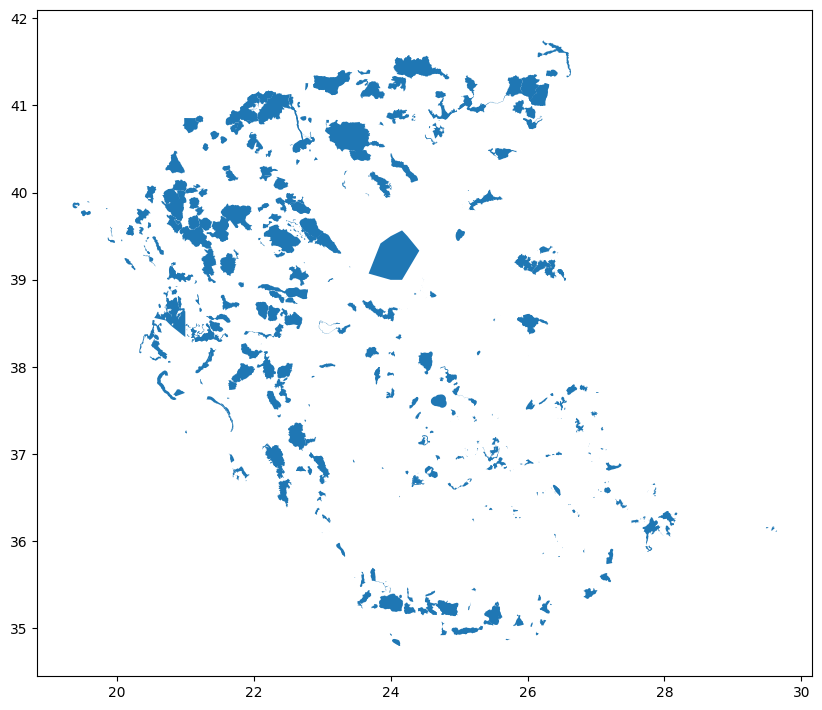

In [52]:
print(gdf.head())
gdf.plot(figsize=(10, 10))

We'll now get the Carretta Carretta sightings map and overlay the Natura Map we just created:

In [53]:
# Overlay the Natura RDF polygons
folium.GeoJson(
    gdf,
    name="Natura 2000",
    tooltip=folium.GeoJsonTooltip(fields=["name"], aliases=["Site Name:"]),
    style_function=lambda feature: {
        "fillColor": "#228B22",  # forest green
        "color": "#006400",      # dark green border
        "weight": 1,
        "fillOpacity": 0.4
    }
).add_to(caretta_map)

Finally, I'll add a layer control widget, which allows the user to toggle layers on and off in the map UI

In [54]:
folium.LayerControl().add_to(caretta_map)

In [55]:
caretta_map

And finally let's export the map as html:

In [56]:
caretta_map.save("caretta_natura_map.html")

That's it!